In [2]:
import pandas as pd
import plotly.express as px

In [3]:
ev = pd.read_csv('https://raw.githubusercontent.com/Frans-Grau/ElectricVehicleVsChargingStations/main/Datasets/WA-Final.csv')
cs = pd.read_csv('https://raw.githubusercontent.com/Frans-Grau/ElectricVehicleVsChargingStations/main/Datasets/Cstations2.csv')

C:\Users\frans\AppData\Local\Temp\ipykernel_11176\1654755984.py:2: DtypeWarning: Columns (3,6,10,13,14,15,16,20,29,31,33,34,35,36,43,45,46,47,49,52,53,54,56,57,58,59,60,61,62,63) have mixed types. Specify dtype option on import or set low_memory=False.
  cs = pd.read_csv('https://raw.githubusercontent.com/Frans-Grau/ElectricVehicleVsChargingStations/main/Datasets/Cstations2.csv')


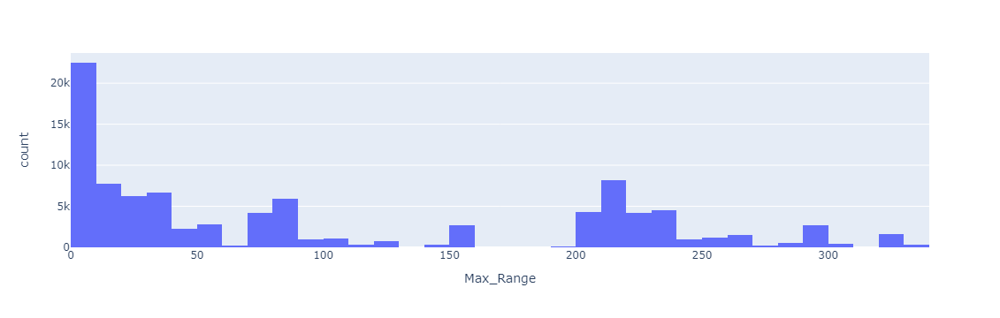

In [13]:
df = ev[ev['Max_Range']>1]
fig = px.histogram(df, x="Max_Range", nbins=50)
fig.show()

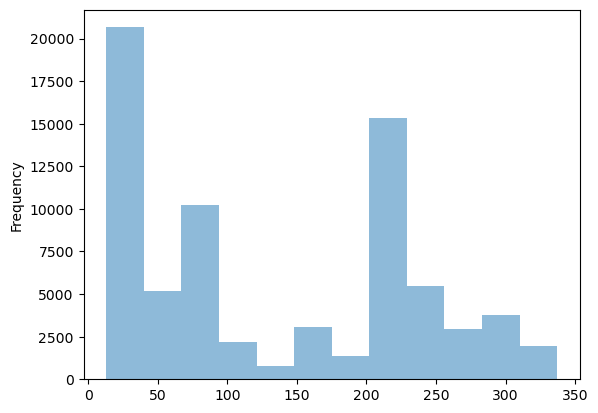

In [19]:
df=ev[ev['Max_Range']>10]
ax = df['Max_Range'].plot.hist(bins=12, alpha=0.5)

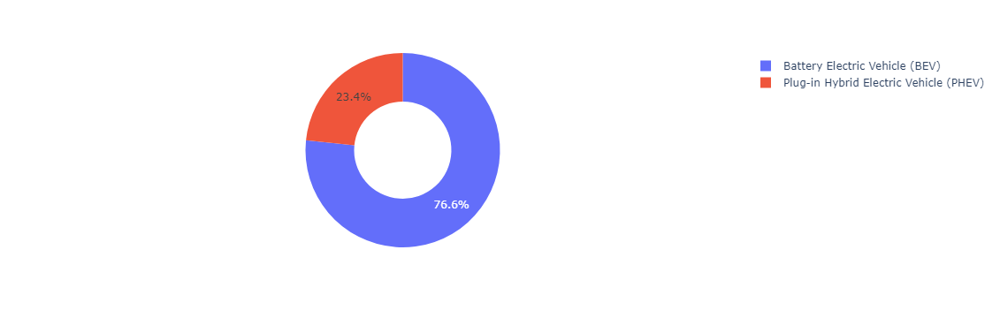

In [22]:
df1 = ev['Electric Vehicle Type'].value_counts()
px.pie(ev, values=df1.values, names=df1.index,hole=.5)

In [26]:
ev['Vehicle Location'].value_counts()

POINT (-122.13158 47.67858)    2979
POINT (-122.2066 47.67887)     2083
POINT (-122.1872 47.61001)     1996
POINT (-122.31765 47.70013)    1900
POINT (-122.21061 47.83448)    1894
                               ... 
POINT (-123.29831 46.57001)       1
POINT (-123.6386 46.33397)        1
POINT (-121.59274 48.48758)       1
POINT (-118.20299 48.11777)       1
POINT (-119.10557 47.69015)       1
Name: Vehicle Location, Length: 517, dtype: int64

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

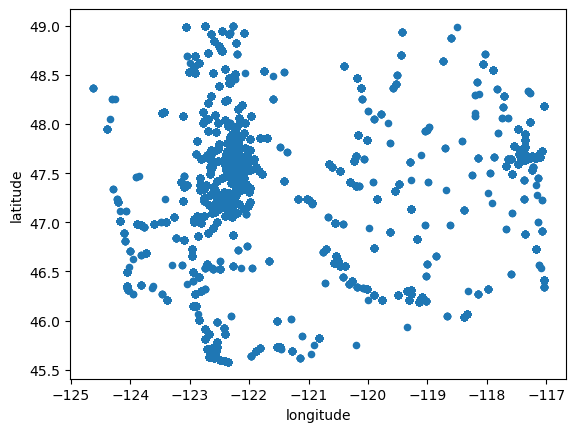

In [27]:
# Split the coordinates column into longitude and latitude
ev[['longitude', 'latitude']] = ev['Vehicle Location'].str.extract(r'POINT \((-?\d+\.\d+) (-?\d+\.\d+)\)')

# Convert longitude and latitude to numeric
ev[['longitude', 'latitude']] = ev[['longitude', 'latitude']].astype(float)

# Plot the longitude and latitude
ev.plot.scatter(x='longitude', y='latitude', s=None, c=None)

In [5]:
ev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114042 entries, 0 to 114041
Data columns (total 20 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   Unnamed: 0                                         114042 non-null  int64  
 1   County                                             114042 non-null  object 
 2   City                                               114042 non-null  object 
 3   State                                              114042 non-null  object 
 4   Make                                               114042 non-null  object 
 5   Model                                              114042 non-null  object 
 6   Postal Code                                        114042 non-null  int64  
 7   Model Year                                         114042 non-null  int64  
 8   Electric Vehicle Type                              114042 non-null  object

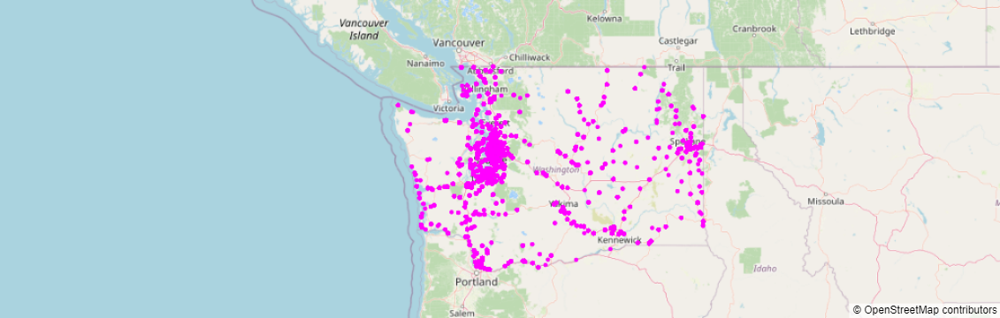

In [57]:
fig = px.scatter_mapbox(ev, lat="latitude", lon="longitude", hover_name="City",
                        color_discrete_sequence=["fuchsia"], zoom=5, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

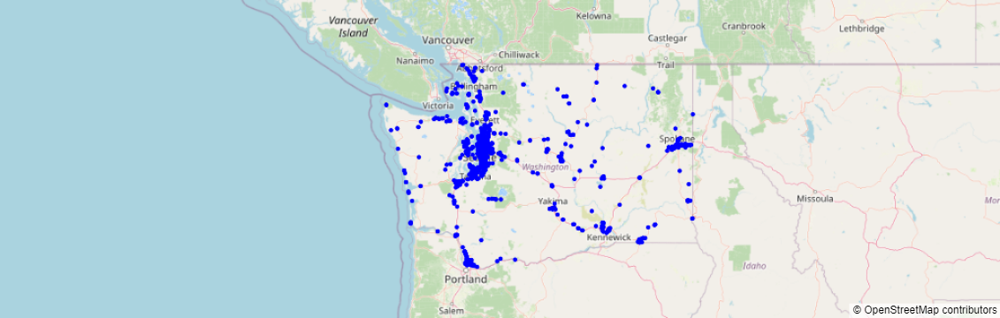

In [55]:
cs1 = cs[cs['State']=='WA']
fig = px.scatter_mapbox(cs1, lat="Latitude", lon="Longitude", hover_name="City",
                        color_discrete_sequence=["blue"], zoom=5, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()